<a href="https://colab.research.google.com/github/chanxxw/AIFFEL_quest_cr/blob/master/MainQuest/WC_Project_DeepCV10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 1

- VGG16 모델의 구조를 파악하셨나요? 파악한 VGG16 모델을 코드로 구현해 보는 것이 첫 번째 프로젝트입니다. 프로젝트는 크게 2개의 문제로 구성되어 있습니다.

### 문제 1-1. VGG16 모델 구현하기
- 영상의 내용을 참고하여 직접 코드로 모델을 구현해 보세요. Batch Normalization, Parameter Initialization 등을 사용할 수도 있습니다.

### 문제 1-2. 다양한 방법을 사용하여 모델의 성능 올리기
- skip connection, pre-trained model 등 다양한 방법을 사용하여 기본적인 VGG16 모델의 성능보다 높은 정확도를 구해보세요.



In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt


In [2]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

68606236/68606236 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [3]:
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train
/root/.keras/datasets/cats_and_dogs_filtered/validation


In [4]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')
print(train_cats_dir)

# directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')
print(validation_dogs_dir)

/root/.keras/datasets/cats_and_dogs_filtered/train/cats
/root/.keras/datasets/cats_and_dogs_filtered/train/dogs
/root/.keras/datasets/cats_and_dogs_filtered/validation/cats
/root/.keras/datasets/cats_and_dogs_filtered/validation/dogs


In [5]:
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [6]:
# parameter Initialization
batch_size = 16
epochs = 5
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [7]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

### 1. `def plotImages(images_arr):`
- **의미**: `plotImages`라는 함수를 정의합니다. 이 함수는 `images_arr`라는 이미지 배열을 인자로 받습니다.
- **설명**: 이미지 배열을 받아서 이 배열에 포함된 여러 이미지를 한 번에 그리는 함수입니다.

### 2. `fig, axes = plt.subplots(1, 5, figsize=(10,10))`
- **의미**: `plt.subplots()`를 사용해 1행 5열의 서브플롯을 생성하고, `fig`는 전체 그림, `axes`는 개별 서브플롯을 나타냅니다. `figsize=(10,10)`는 그림의 크기를 가로 10인치, 세로 10인치로 설정합니다.
- **설명**: 이 명령어는 하나의 창에 5개의 이미지를 나란히 배치하기 위한 그리드(플롯 공간)를 만듭니다. 각각의 서브플롯에 이미지를 그릴 수 있는 공간이 할당됩니다.

### 3. `axes = axes.flatten()`
- **의미**: `axes`는 원래 2D 배열로 되어 있지만, `flatten()` 함수를 사용해 이를 1D 배열로 변환합니다.
- **설명**: 서브플롯이 1행 5열로 생성되었기 때문에, 각 서브플롯을 1차원 배열로 만들어 `for`문을 통해 순서대로 접근하기 쉽게 변환합니다.

### 4. `for img, ax in zip(images_arr, axes):`
- **의미**: `images_arr`의 이미지와 `axes`의 서브플롯을 동시에 순환(`zip()`)하면서 각 서브플롯에 이미지를 그리기 위한 반복문을 만듭니다.
- **설명**: 이미지 배열과 서브플롯 배열을 쌍으로 묶어, 각 이미지가 서브플롯에 대응하도록 설정합니다.

### 5. `ax.imshow(img)`
- **의미**: 서브플롯(`ax`)에 이미지를 표시하는 함수입니다.
- **설명**: `img` 변수에 담긴 이미지를 `ax`라는 서브플롯에 그립니다. `imshow()`는 이미지를 시각화하는 데 사용하는 함수입니다.

### 6. `ax.axis('off')`
- **의미**: 서브플롯에서 축을 표시하지 않도록 설정합니다.
- **설명**: 이미지 주위에 나오는 축과 눈금을 숨깁니다. 이미지만 깔끔하게 보이게 하기 위함입니다.

### 7. `plt.tight_layout()`
- **의미**: 서브플롯 간의 여백을 자동으로 조절해 겹치지 않도록 레이아웃을 조정합니다.
- **설명**: 서브플롯끼리 공간을 알맞게 배치하여 이미지들이 서로 겹치지 않게 만듭니다.

### 8. `plt.show()`
- **의미**: 현재 그려진 이미지를 화면에 표시합니다.
- **설명**: 설정한 내용대로 이미지를 시각화하고, 사용자에게 그 결과를 보여주는 명령어입니다.

이 함수는 이미지 배열을 받아서 5개의 이미지를 한 화면에 깔끔하게 나열해 보여주는 역할을 합니다.

In [8]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     vertical_flip=False)

train 데이터가 2천장 밖에 되지 않기 때문에 Data Augmentation(데이터 증강)을 통해 데이터의 수를 늘립니다.

Data Augmentation은 Rescale, Rotation, Random Crop, Zoom, Flip 등 다양한 기법을 사용하여 데이터의 양을 증가시키는 것입니다.   
range의 숫자를 변화시키거나 Flip에서 True/False를 적절하게 사용하여 다양한 실험을 해보세요.  
Data augmentation은 딥러닝, 특히 컴퓨터 비전(CV)에서 모델의 성능을 높이기 위해 자주 사용되는 기법입니다.  
기본적으로 주어진 데이터셋의 크기를 인위적으로 늘리기 위해 기존 데이터의 변형을 만들어 새로운 데이터를 생성하는 방법입니다.  
이렇게 하면 더 많은 학습 데이터를 제공할 수 있어 모델이 더 일반화된 성능을 보일 수 있습니다.  

주요 변형 방법은 다음과 같습니다:  

1. **회전 (Rotation)**: 이미지를 일정 각도로 회전시켜 새로운 이미지를 만듭니다.
2. **수평/수직 뒤집기 (Horizontal/Vertical Flip)**: 이미지를 좌우 또는 상하로 뒤집습니다.
3. **크기 조절 (Scaling)**: 이미지를 확대하거나 축소합니다.
4. **잘라내기 (Cropping)**: 이미지의 일부분만 사용하여 학습합니다.
5. **이동 (Translation)**: 이미지를 상하좌우로 약간 이동시킵니다.
6. **노이즈 추가 (Adding Noise)**: 이미지에 임의의 노이즈를 추가하여 다양성을 높입니다.
7. **색상 변형 (Color Jittering)**: 이미지의 밝기, 대비, 채도를 임의로 변경합니다.

이러한 방법은 특히 데이터가 적을 때 모델의 과적합(overfitting)을 방지하고 더 강건한 모델을 만드는 데 도움이 됩니다.

이 개념은 특히 이미지 인식 작업에서 자주 사용되지만, 텍스트나 시계열 데이터를 다룰 때도 유사한 기법이 적용될 수 있습니다.

In [9]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [10]:
train_data_gen[0][0].shape

(16, 256, 256, 3)

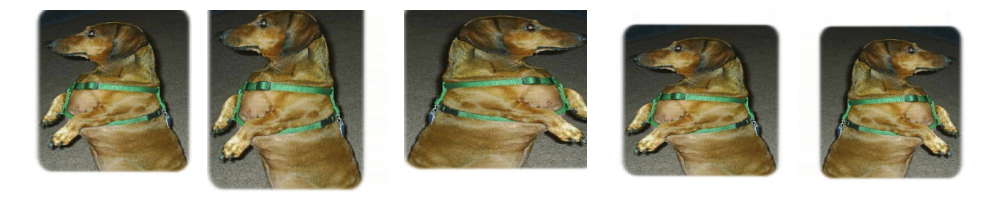

In [11]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [12]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [13]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


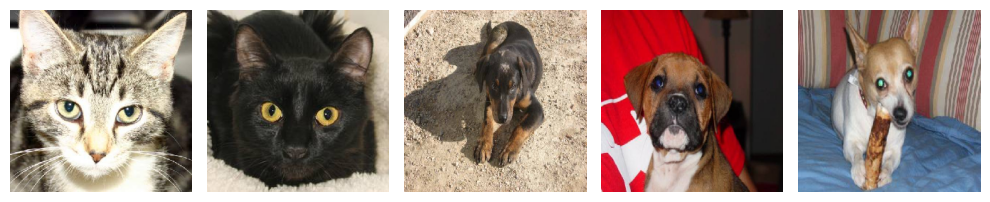

In [14]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [15]:
_[:5] # 정답 데이터

array([0., 0., 1., 1., 1.], dtype=float32)

### 문제 1-1. VGG16 모델 구현하기
- 이제 VGG16 모델을 구현해 볼 시간입니다. 바로 혼자서 모델을 구현하라고 하면 어렵겠죠? 그래서 참고할만한 모델 구현 코드를 아래에 적어 보았습니다. 실제 VGG16 모델과는 살짝 구조가 다르기 때문에 이미지를 보면서 어느 부분이 다른치 찾아 보는 것도 좋을 것 같습니다.

In [16]:
# 참고 코드
# parameter initialization
# skip connection 적용 해보기 쉽지는 않을 듯.
# 이대로 하면 원하는 accuracy가 안나온대, 약 50%일 듯
# performance metric을 높여서 accuracy를 높여봐
# accuracy를 높이는 건 원래 어려워
'''
input_layer=tf.keras.layers.Input(shape=(256, 256, 3))
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x=tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x=tf.keras.layers.BatchNormalization()(x)
x=tf.keras.layers.MaxPool2D((2, 2))(x)

x=tf.keras.layers.Flatten()(x)
x=tf.keras.layers.Dense(1024, activation='relu')(x)
x=tf.keras.layers.Dense(512, activation='relu')(x)
out_layer=tf.keras.layers.Dense(1, activation='sigmoid')(x)

model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
model.summary()
'''
import tensorflow as tf

# Input Layer
input_layer = tf.keras.layers.Input(shape=(256, 256, 3))

# First Conv Block
x = tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
x = tf.keras.layers.Conv2D(32, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Skip Connection 1
skip1 = x  # Save the output of the first block

# Second Conv Block
x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Skip Connection 2
skip2 = x  # Save the output of the second block

# Third Conv Block
x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Adjust skip2's shape to match x
skip2 = tf.keras.layers.Conv2D(128, (1, 1), strides=2, padding='same')(skip2)  # Match channels and reduce spatial dimensions

# Skip Connection 적용 (Residual 연결)
x = tf.keras.layers.Add()([x, skip2])  # Skip connection after the third block

# Flatten and Fully Connected Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

# Model Definition
model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])

# Model Summary
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 32)   │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 32)   │          9,248 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 32)   │            128 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 32)   │              0 │ batch_normalization[0… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 64)   │         18,496 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 64)   │         36,928 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 128, 128, 64)   │            256 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 64)     │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 128)    │        147,584 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 64, 64, 128)    │            512 │ conv2d_5[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 128)    │              0 │ batch_normalization_2… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 32, 32, 128)    │          8,320 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 32, 32, 128)    │              0 │ max_pooling2d_2[0][0], │
│                           │                        │                │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 131072)         │              0 │ add[0][0]              │
├──────────────────────

 Total params: 135,040,289 (515.14 MB)

 Trainable params: 135,039,841 (515.14 MB)

 Non-trainable params: 448 (1.75 KB)

In [17]:
# 문제1-1. 이미지에 나온 VGG16 모델을 구현하세요.
# [[YOUR CODE]]
'''
import tensorflow as tf
from tensorflow.keras import layers, models

def VGG16():
    model = models.Sequential()

    # Block 1
    model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(224, 224, 3)))
    model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 2
    model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 3
    model.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 4
    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 5
    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(512, (3, 3), padding='same', activation='relu'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))

    # Fully connected layers
    model.add(layers.Flatten())
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dense(1000, activation='softmax'))  # Output for 1000 classes

    return model

# Model initialization and summary
model = VGG16()
model.summary()
'''

"\nimport tensorflow as tf\nfrom tensorflow.keras import layers, models\n\ndef VGG16():\n    model = models.Sequential()\n\n    # Block 1\n    model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu', input_shape=(224, 224, 3)))\n    model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))\n    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))\n\n    # Block 2\n    model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu'))\n    model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu'))\n    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))\n\n    # Block 3\n    model.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))\n    model.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))\n    model.add(layers.Conv2D(256, (3, 3), padding='same', activation='relu'))\n    model.add(layers.MaxPooling2D((2, 2), strides=(2, 2)))\n\n    # Block 4\n    model.add(layers.Conv2D(512, (3, 3), padding='same', ac

In [18]:
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

# callbacks_list= [tf.keras.callbacks.TensorBoard(log_dir='log_dir', histogram_freq=1)]
# callback 함수를 활용하고 싶다면 추가해서 학습하는 데에 활용해 보세요.

In [19]:
print(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))
print(batch_size)

2000
16


In [20]:
# generator는 입력과 타깃의 배치사이즈만큼 데이터를 생성합니다.
# steps_per_epoch가 100이면 위에서 선언된 배치 수만큼의 인풋/아웃풋 데이터가 100번 생성되어 학습이 진행됩니다.
# 만약 배치가 20이면, 20의 배치인 데이터가 100번만큼 생성되어 학습하게 됩니다.
# 즉 20의 배치 데이터를 100번 학습완료하던 1에포크가 완성됩니다.
# 단, 20의 배치데이터를 생성할때마다 랜덤적으로 생성합니다.
# 일반적으로 'Training 데이터 길이/배치사이즈'를 steps_per_epoch로 설정합니다.
'''
history = model.fit(
      train_data_gen,
      steps_per_epoch=(len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size,
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=callbacks_list,
      validation_freq=1)
'''
history = model.fit(
      train_data_gen,
      steps_per_epoch=int((len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir))) / batch_size),  # int()로 변환
      epochs=epochs,
      validation_data=val_data_gen,
      # callbacks=callbacks_list, 콜백했더니 epoch가 1번하고 멈춰서 일단 안할래요
      validation_freq=1)


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


125/125 ━━━━━━━━━━━━━━━━━━━━ 68s 332ms/step - binary_accuracy: 0.4715 - loss: 144.6920 - val_binary_accuracy: 0.4990 - val_loss: 0.6932
Epoch 2/5


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - binary_accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_binary_accuracy: 0.4990 - val_loss: 0.6932
Epoch 3/5
125/125 ━━━━━━━━━━━━━━━━━━━━ 57s 301ms/step - binary_accuracy: 0.4733 - loss: 0.6943 - val_binary_accuracy: 0.5010 - val_loss: 0.6939
Epoch 4/5
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - binary_accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_binary_accuracy: 0.5010 - val_loss: 0.6939
Epoch 5/5
125/125 ━━━━━━━━━━━━━━━━━━━━ 37s 287ms/step - binary_accuracy: 0.4810 - loss: 0.6899 - val_binary_accuracy: 0.5010 - val_loss: 0.6966


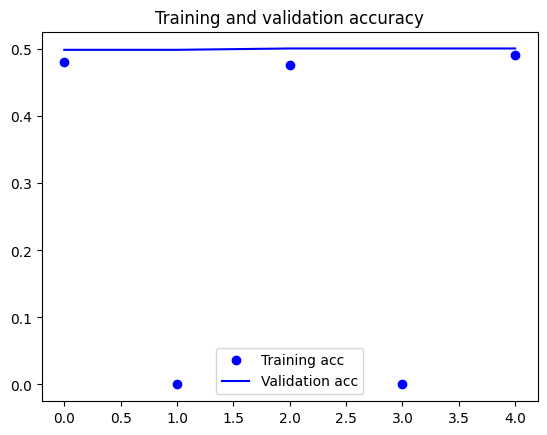

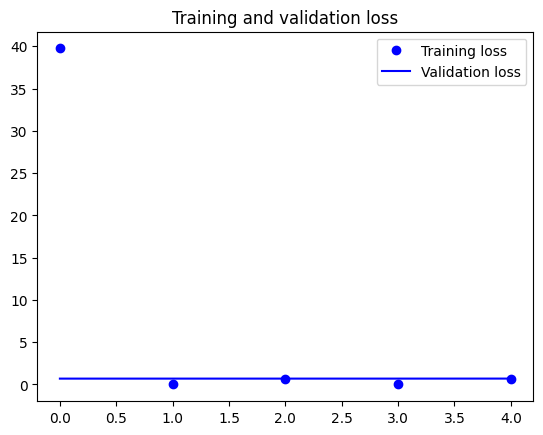

In [21]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### 문제 1-2. 다양한 방법을 사용하여 모델의 성능 올리기
- hyperparameter 변경, 모델 수정, optimizer 변경, skip connection, pre-trained model 등 다양한 방법을 사용하면 모델의 성능을 높일 수 있습니다. 다양한 실험을 통해 성능을 올려 보세요.

In [22]:
# 문제 1-2. hyperparameter 설정
# [[YOUR CODE]]
# 문제 1-2. hyperparameter 설정
# [[YOUR CODE]]
import tensorflow as tf

# Input Layer
input_layer = tf.keras.layers.Input(shape=(256, 256, 3))

# First Conv Block
x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)  # 필터 개수를 64로 증가
x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Second Conv Block
x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)  # 필터 개수를 128로 증가
x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Third Conv Block
x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)  # 필터 개수를 256으로 증가
x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.MaxPool2D((2, 2))(x)

# Flatten and Fully Connected Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(1024, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)  # L2 정규화 적용
x = tf.keras.layers.Dropout(0.4)(x)  # Dropout 비율 0.4로 증가
x = tf.keras.layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
x = tf.keras.layers.Dropout(0.4)(x)
out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)

# Model Definition
model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])


In [23]:
# 문제 1-2. 데이터 generator 생성
# [[YOUR CODE]]
train_datagen = ImageDataGenerator(
    rescale=1./255,  # 모든 픽셀 값을 0~1 범위로 정규화
    rotation_range=40,  # 최대 40도 회전
    width_shift_range=0.2,  # 가로로 최대 20% 이동
    height_shift_range=0.2,  # 세로로 최대 20% 이동
    shear_range=0.2,  # 전단 변환
    zoom_range=0.2,  # 줌 변환
    horizontal_flip=True,  # 이미지 수평 뒤집기
    fill_mode='nearest'  # 변환 후 빈 공간을 최근접 픽셀 값으로 채우기
)

# 검증 데이터 제너레이터는 데이터 증강을 적용하지 않음
val_datagen = ImageDataGenerator(rescale=1./255)

In [24]:
# 문제 1-2. 모델 구현
# [[YOUR CODE]]

# Model Summary
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 256, 256, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 128, 128, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128, 128, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 64, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 262144)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1024)                │     268,436,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 270,108,993 (1.01 GB)

 Trainable params: 270,108,097 (1.01 GB)

 Non-trainable params: 896 (3.50 KB)

In [25]:
# 문제 1-2. loss function, optimizer, metric 설정 및 모델 컴파일
# [[YOUR CODE]]


# Compile model with adjusted learning rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.00005)  # 학습률 감소
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['binary_accuracy'])


In [26]:
# 모델 학습
history = model.fit(
    train_data_gen,
    steps_per_epoch=int((len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir))) / batch_size),  # 정수로 변환
    epochs=10,
    validation_data=val_data_gen,
   # callbacks=callbacks_list,
    validation_freq=1,
    batch_size=64
)

Epoch 1/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 87s 457ms/step - binary_accuracy: 0.5753 - loss: 5.7944 - val_binary_accuracy: 0.5000 - val_loss: 3.7786
Epoch 2/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - binary_accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_binary_accuracy: 0.5000 - val_loss: 3.7786
Epoch 3/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 46s 354ms/step - binary_accuracy: 0.6057 - loss: 4.8443 - val_binary_accuracy: 0.5000 - val_loss: 8.6313
Epoch 4/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - binary_accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_binary_accuracy: 0.5000 - val_loss: 8.6313
Epoch 5/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 47s 354ms/step - binary_accuracy: 0.5974 - loss: 4.3984 - val_binary_accuracy: 0.5020 - val_loss: 5.5879
Epoch 6/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - binary_accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_binary_accuracy: 0.5020 - val_loss: 5.5879
Epoch 7/10
125/125 ━━━━━━━━━━━━━━━━━━━━ 46s 354ms/step - binary_accuracy: 0.6309 - loss: 3.9269 - val_binary_acc

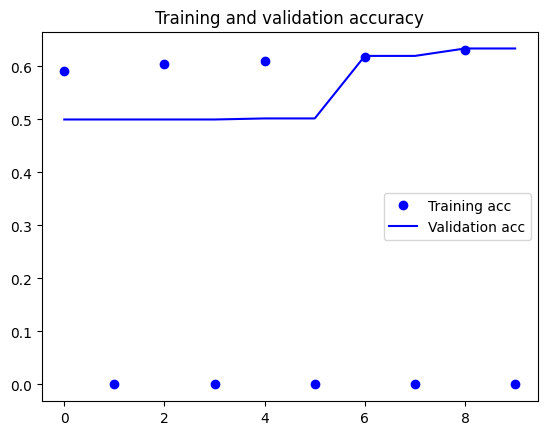

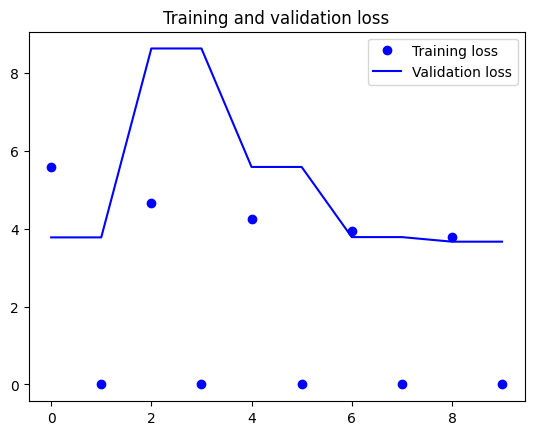

In [27]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.plot(epochs_range, acc, 'bo', label='Training acc')
plt.plot(epochs_range, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, loss, 'bo', label='Training loss')
plt.plot(epochs_range, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# Project 2

In [28]:
!pip3 install tensorflow-estimator==2.6.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.9/462.9 kB 9.1 MB/s eta 0:00:00


In [29]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [30]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [31]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False):

  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.LANCZOS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [32]:
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

  # BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getbbox(ds)[3] - font.getbbox(ds)[1] for ds in display_str_list]

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    bbox = font.getbbox(display_str)  # getbbox가 반환하는 4개의 좌표값을 변수에 저장
    text_width = bbox[2] - bbox[0]   # bbox의 너비 계산 (xmax - xmin)
    text_height = bbox[3] - bbox[1]  # bbox의 높이 계산 (ymax - ymin)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

'''
def draw_bounding_box_on_image(image,
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):

  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getbbox(ds)[1] for ds in display_str_list]

  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height

  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getbbox(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

    '''

'\ndef draw_bounding_box_on_image(image,\n                               ymin, xmin, ymax, xmax,\n                               color,\n                               font,\n                               thickness=4,\n                               display_str_list=()):\n\n  draw = ImageDraw.Draw(image)\n  im_width, im_height = image.size\n  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,\n                                ymin * im_height, ymax * im_height)\n\n# BBox 테두리 그리기\n  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),\n             (left, top)],\n            width=thickness,\n            fill=color)\n\n  display_str_heights = [font.getbbox(ds)[1] for ds in display_str_list]\n\n  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)\n\n  if top > total_display_str_height:\n    text_bottom = top\n  else:\n    text_bottom = top + total_display_str_height\n\n  for display_str in display_str_list[::-1]:\n    text_width, text_heig

In [33]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmpyu_woa69.jpg.


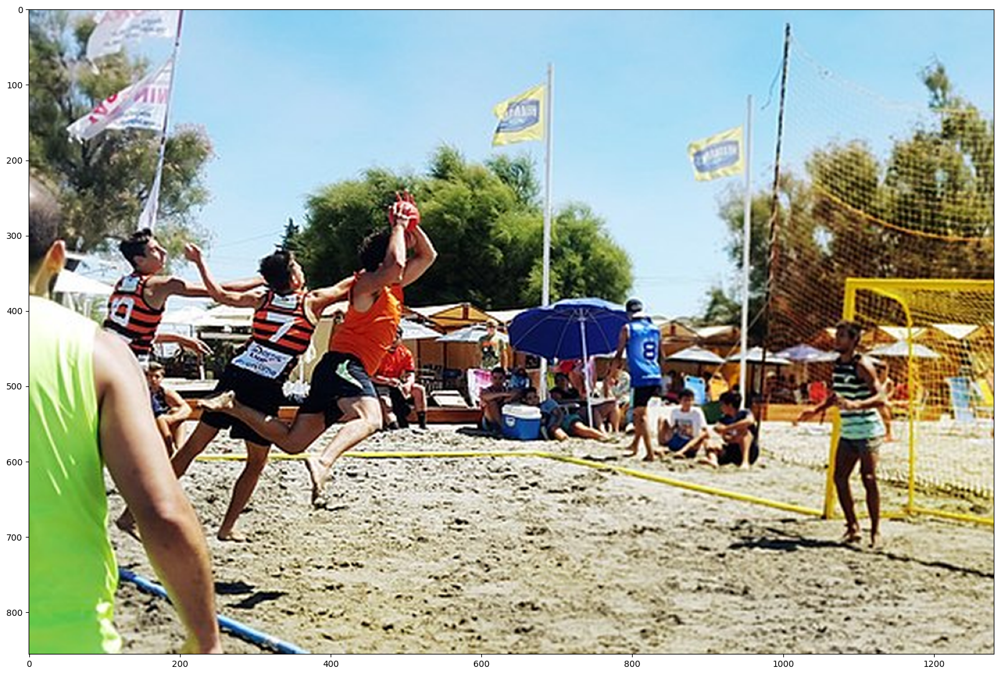

In [34]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [35]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

In [36]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [37]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)



Found 100 objects.
Inference time:  62.209049701690674


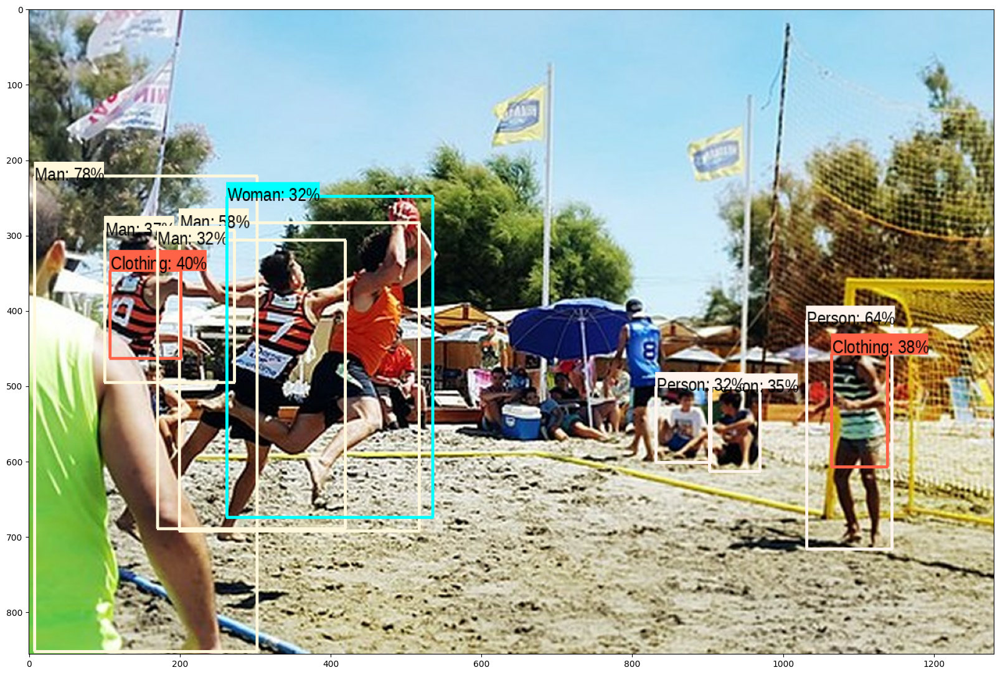

In [38]:
run_detector(detector, downloaded_image_path)

### 문제 2-1. 다른 이미지 테스트해보기
원하는 이미지를 불러와 결과를 확인해 봅시다.

Image downloaded to /tmp/tmpgc205tdi.jpg.


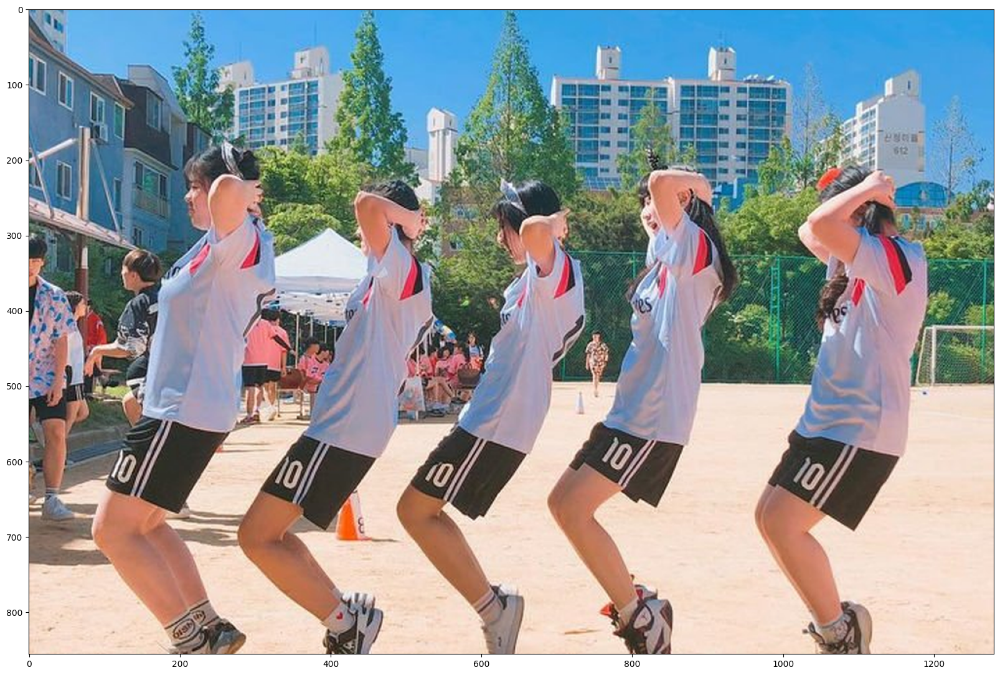

In [39]:
# 이미지 불러오기
# [[YOUR CODE]]
image_url = "https://post-phinf.pstatic.net/MjAxODExMjhfMjM3/MDAxNTQzMzc0MDAwMTM5.ffRzKXNL38SuNEYtLTRfuk3grBcOSkxG4l5vQ--frnIg.a-x9XQvI5Ql7xwXcuDrosB7mR8TnCCydmToGBKEt4Egg.JPEG/02.jpg?type=w1200"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.


Found 100 objects.
Inference time:  1.5546927452087402


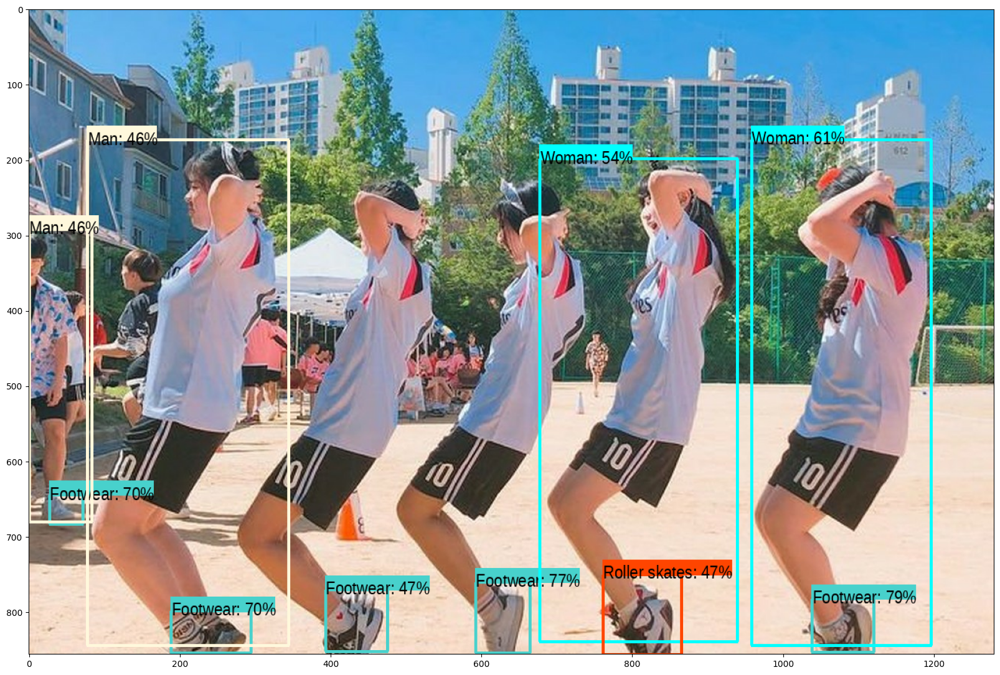

In [40]:
# 테스트
#[[YOUR CODE]]
run_detector(detector, downloaded_image_path)

### 문제 2-2. 다양한 pre-trained model 테스트해보기
Faster RCNN 외에도 Object Detection을 할 수 있는 다양한 사전 학습 모델이 있습니다. tfhub을 탐색하여 사용할 수 있는 1개 이상의 모델을 불러와 결과를 테스트해보고, 그 결과를 비교해 보세요.

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Image downloaded to /tmp/tmpdt0w5vmn.jpg.


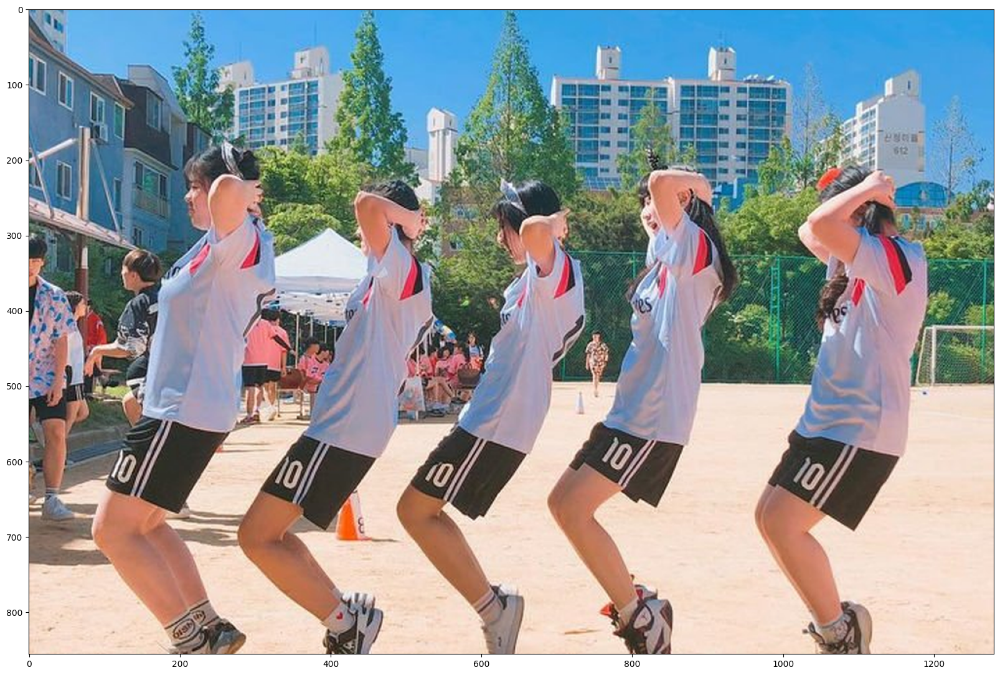

In [43]:
# 문제 2-2. 모델 불러오기
# [[YOUR CODE]]
!pip install tensorflow tensorflow-hub tensorflow-gpu opencv-python-headless

import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import cv2
import matplotlib.pyplot as plt

# TensorFlow Hub에서 SSD 모델 불러오기
detector = hub.load("https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2")

# 분석할 이미지 불러오기
image_path = "https://post-phinf.pstatic.net/MjAxODExMjhfMjM3/MDAxNTQzMzc0MDAwMTM5.ffRzKXNL38SuNEYtLTRfuk3grBcOSkxG4l5vQ--frnIg.a-x9XQvI5Ql7xwXcuDrosB7mR8TnCCydmToGBKEt4Egg.JPEG/02.jpg?type=w1200"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.
image = cv2.imread(downloaded_image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV는 BGR 형식으로 이미지를 불러오므로 RGB로 변환

# 이미지를 모델 입력에 맞게 변환
input_tensor = tf.convert_to_tensor(image_rgb)
input_tensor = input_tensor[tf.newaxis, ...]  # 배치 차원 추가


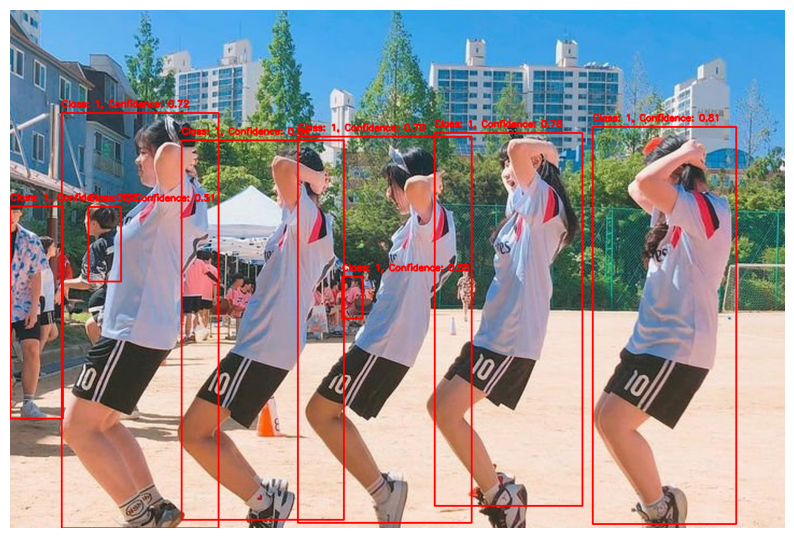

In [44]:
# 문제 2-2. 테스트
# [[YOUR CODE]]

# Object Detection 수행
results = detector(input_tensor)

# 결과 정보 추출
detection_boxes = results['detection_boxes'].numpy()[0]  # Bounding Box 좌표
detection_classes = results['detection_classes'].numpy()[0].astype(int)  # 클래스 ID
detection_scores = results['detection_scores'].numpy()[0]  # 신뢰도

# Bounding Box를 원본 이미지에 그리기
height, width, _ = image.shape

for i in range(len(detection_scores)):
    if detection_scores[i] > 0.5:  # 신뢰도 50% 이상만 그리기
        box = detection_boxes[i] * [height, width, height, width]  # 좌표 변환
        y1, x1, y2, x2 = box.astype(int)

        # BBOX 그리기
        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)

        # 클래스 라벨 및 신뢰도 표시
        label = f'Class: {detection_classes[i]}, Confidence: {detection_scores[i]:.2f}'
        cv2.putText(image_rgb, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# 결과 이미지 시각화
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()


In [45]:
# 문제 2-2. 결과 비교
print("1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.")
print("2번째 모델인 YOLOv8이 분명 더 좋은 detection인 것 같기는 한데, 내가 뭘 잘못한건지, confidence로만 구분하는지 이유를 모르겠다.")

1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.
2번째 모델인 YOLOv8이 분명 더 좋은 detection인 것 같기는 한데, 내가 뭘 잘못한건지, confidence로만 구분하는지 이유를 모르겠다.
